In [1]:
# Supress Warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Uploading files to drive
from google.colab import files
uploaded = files.upload()

Saving cancer_reg.csv to cancer_reg.csv


In [3]:
# Importing necessary libraries
import numpy as np
import pandas as pd

In [4]:
# Importing csv file
df = pd.read_csv('cancer_reg.csv', encoding='unicode_escape')
df.head()

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,binnedInc,MedianAge,MedianAgeMale,MedianAgeFemale,Geography,AvgHouseholdSize,PercentMarried,PctNoHS18_24,PctHS18_24,PctSomeCol18_24,PctBachDeg18_24,PctHS25_Over,PctBachDeg25_Over,PctEmployed16_Over,PctUnemployed16_Over,PctPrivateCoverage,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
0,1397.0,469,164.9,489.8,61898,260131,11.2,499.748204,"(61494.5, 125635]",39.3,36.9,41.7,"Kitsap County, Washington",2.54,52.5,11.5,39.5,42.1,6.9,23.2,19.6,51.9,8.0,75.1,NaN,41.6,32.9,14.0,81.780529,2.594728,4.821857,1.843479,52.856076,6.118831
1,173.0,70,161.3,411.6,48127,43269,18.6,23.111234,"(48021.6, 51046.4]",33.0,32.2,33.7,"Kittitas County, Washington",2.34,44.5,6.1,22.4,64.0,7.5,26.0,22.7,55.9,7.8,70.2,53.8,43.6,31.1,15.3,89.228509,0.969102,2.246233,3.741352,45.372500,4.333096
2,102.0,50,174.7,349.7,49348,21026,14.6,47.560164,"(48021.6, 51046.4]",45.0,44.0,45.8,"Klickitat County, Washington",2.62,54.2,24.0,36.6,NaN,9.5,29.0,16.0,45.9,7.0,63.7,43.5,34.9,42.1,21.1,90.922190,0.739673,0.465898,2.747358,54.444868,3.729488
3,427.0,202,194.8,430.4,44243,75882,17.1,342.637253,"(42724.4, 45201]",42.8,42.2,43.4,"Lewis County, Washington",2.52,52.7,20.2,41.2,36.1,2.5,31.6,9.3,48.3,12.1,58.4,40.3,35.0,45.3,25.0,91.744686,0.782626,1.161359,1.362643,51.021514,4.603841
4,57.0,26,144.4,350.1,49955,10321,12.5,0.000000,"(48021.6, 51046.4]",48.3,47.8,48.9,"Lincoln County, Washington",2.34,57.8,14.9,43.0,40.0,2.0,33.4,15.0,48.2,4.8,61.6,43.9,35.1,44.0,22.7,94.104024,0.270192,0.665830,0.492135,54.027460,6.796657


**UNDERSTANDING DATA**

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3047 entries, 0 to 3046
Data columns (total 34 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   avgAnnCount              3047 non-null   float64
 1   avgDeathsPerYear         3047 non-null   int64  
 2   TARGET_deathRate         3047 non-null   float64
 3   incidenceRate            3047 non-null   float64
 4   medIncome                3047 non-null   int64  
 5   popEst2015               3047 non-null   int64  
 6   povertyPercent           3047 non-null   float64
 7   studyPerCap              3047 non-null   float64
 8   binnedInc                3047 non-null   object 
 9   MedianAge                3047 non-null   float64
 10  MedianAgeMale            3047 non-null   float64
 11  MedianAgeFemale          3047 non-null   float64
 12  Geography                3047 non-null   object 
 13  AvgHouseholdSize         3047 non-null   float64
 14  PercentMarried          

In [6]:
df.shape

(3047, 34)

In [7]:
# Looking for null values
round(df.isnull().sum()/len(df.index)*100,2)

avgAnnCount                 0.00
avgDeathsPerYear            0.00
TARGET_deathRate            0.00
incidenceRate               0.00
medIncome                   0.00
popEst2015                  0.00
povertyPercent              0.00
studyPerCap                 0.00
binnedInc                   0.00
MedianAge                   0.00
MedianAgeMale               0.00
MedianAgeFemale             0.00
Geography                   0.00
AvgHouseholdSize            0.00
PercentMarried              0.00
PctNoHS18_24                0.00
PctHS18_24                  0.00
PctSomeCol18_24            74.99
PctBachDeg18_24             0.00
PctHS25_Over                0.00
PctBachDeg25_Over           0.00
PctEmployed16_Over          4.99
PctUnemployed16_Over        0.00
PctPrivateCoverage          0.00
PctPrivateCoverageAlone    19.99
PctEmpPrivCoverage          0.00
PctPublicCoverage           0.00
PctPublicCoverageAlone      0.00
PctWhite                    0.00
PctBlack                    0.00
PctAsian  

In [8]:
# Dropping columns with null values
df.drop(['binnedInc','Geography','PctSomeCol18_24','PctEmployed16_Over','PctPrivateCoverageAlone'], axis = 1, inplace = True)
df.head()

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,MedianAgeFemale,AvgHouseholdSize,PercentMarried,PctNoHS18_24,PctHS18_24,PctBachDeg18_24,PctHS25_Over,PctBachDeg25_Over,PctUnemployed16_Over,PctPrivateCoverage,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
0,1397.0,469,164.9,489.8,61898,260131,11.2,499.748204,39.3,36.9,41.7,2.54,52.5,11.5,39.5,6.9,23.2,19.6,8.0,75.1,41.6,32.9,14.0,81.780529,2.594728,4.821857,1.843479,52.856076,6.118831
1,173.0,70,161.3,411.6,48127,43269,18.6,23.111234,33.0,32.2,33.7,2.34,44.5,6.1,22.4,7.5,26.0,22.7,7.8,70.2,43.6,31.1,15.3,89.228509,0.969102,2.246233,3.741352,45.372500,4.333096
2,102.0,50,174.7,349.7,49348,21026,14.6,47.560164,45.0,44.0,45.8,2.62,54.2,24.0,36.6,9.5,29.0,16.0,7.0,63.7,34.9,42.1,21.1,90.922190,0.739673,0.465898,2.747358,54.444868,3.729488
3,427.0,202,194.8,430.4,44243,75882,17.1,342.637253,42.8,42.2,43.4,2.52,52.7,20.2,41.2,2.5,31.6,9.3,12.1,58.4,35.0,45.3,25.0,91.744686,0.782626,1.161359,1.362643,51.021514,4.603841
4,57.0,26,144.4,350.1,49955,10321,12.5,0.000000,48.3,47.8,48.9,2.34,57.8,14.9,43.0,2.0,33.4,15.0,4.8,61.6,35.1,44.0,22.7,94.104024,0.270192,0.665830,0.492135,54.027460,6.796657


In [9]:
df.shape

(3047, 29)

In [10]:
# Importing libraries for plotting
import matplotlib.pyplot as plt
import seaborn as sns

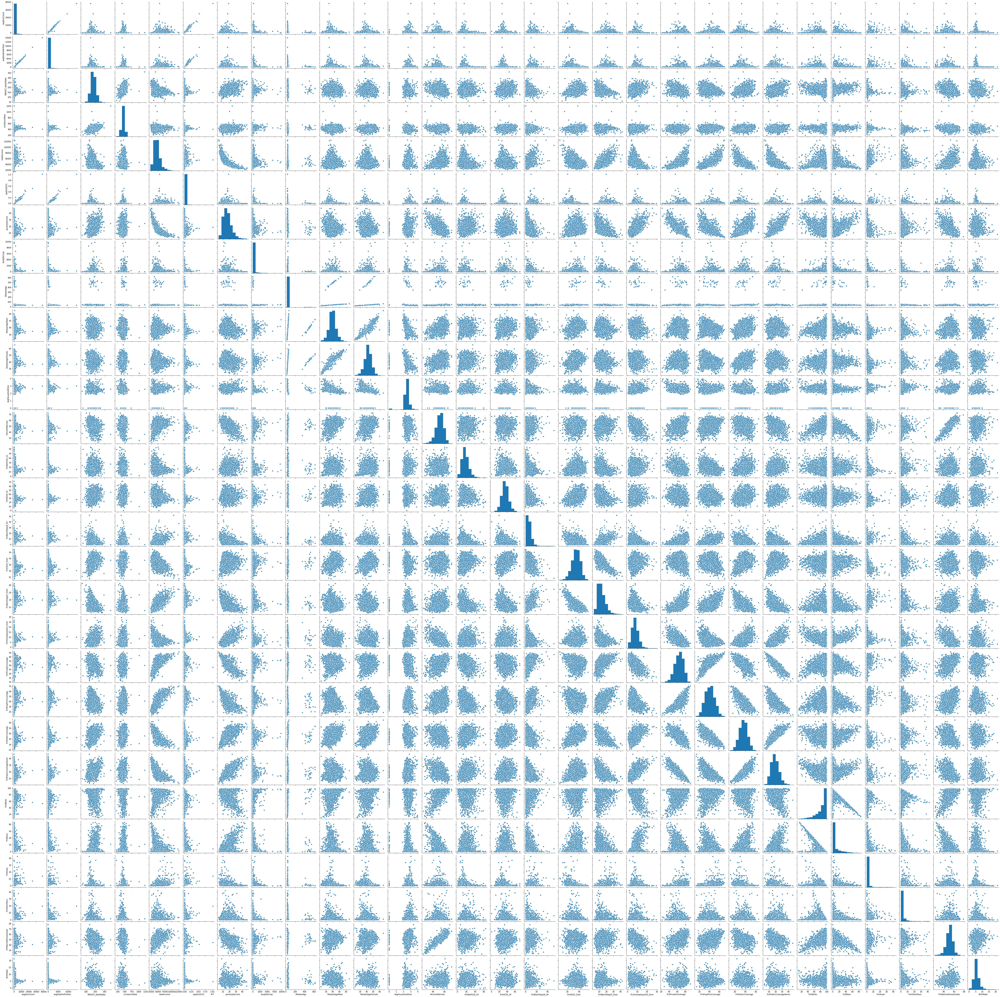

In [11]:
# PAIRPLOT
sns.pairplot(df)
plt.show()

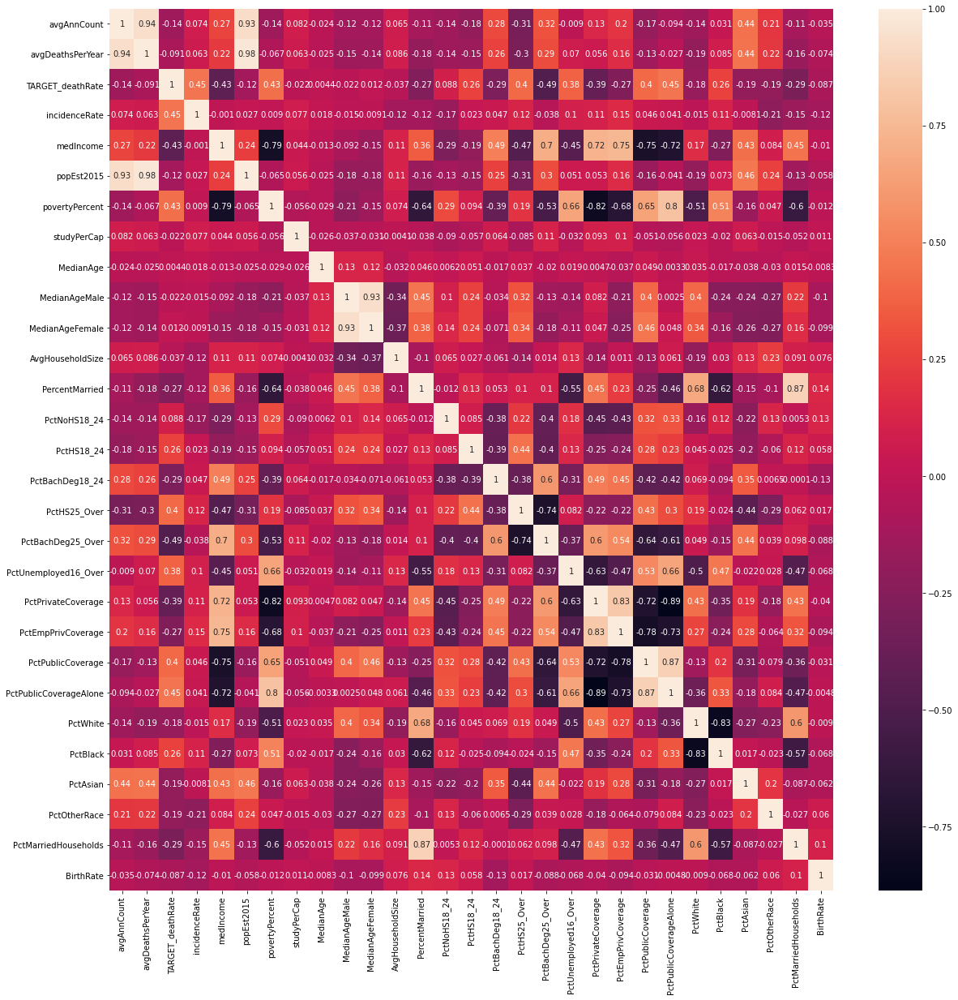

In [12]:
# HEATMAP
plt.subplots(figsize=(20,20))
sns.heatmap(df.corr(), annot = True)

In [13]:
# Splitting the Data into Training and Testing Sets
from sklearn.model_selection import train_test_split
np.random.seed(0)
df_train, df_test = train_test_split(df, train_size = 0.7, test_size = 0.3, random_state = 100)

In [14]:
# Rescaling the Features
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [15]:
num_vars = df.columns
num_vars

Index(['avgAnnCount', 'avgDeathsPerYear', 'TARGET_deathRate', 'incidenceRate',
       'medIncome', 'popEst2015', 'povertyPercent', 'studyPerCap', 'MedianAge',
       'MedianAgeMale', 'MedianAgeFemale', 'AvgHouseholdSize',
       'PercentMarried', 'PctNoHS18_24', 'PctHS18_24', 'PctBachDeg18_24',
       'PctHS25_Over', 'PctBachDeg25_Over', 'PctUnemployed16_Over',
       'PctPrivateCoverage', 'PctEmpPrivCoverage', 'PctPublicCoverage',
       'PctPublicCoverageAlone', 'PctWhite', 'PctBlack', 'PctAsian',
       'PctOtherRace', 'PctMarriedHouseholds', 'BirthRate'],
      dtype='object')

In [16]:
df_train[num_vars] = scaler.fit_transform(df_train[num_vars])
df_train.head()

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,MedianAgeFemale,AvgHouseholdSize,PercentMarried,PctNoHS18_24,PctHS18_24,PctBachDeg18_24,PctHS25_Over,PctBachDeg25_Over,PctUnemployed16_Over,PctPrivateCoverage,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
3008,0.005873,0.005926,0.345567,0.313246,0.197738,0.003327,0.310680,0.040772,0.031401,0.371158,0.442396,0.597254,0.589069,0.355694,0.213846,0.110039,0.626932,0.226913,0.254355,0.652244,0.526902,0.513915,0.389920,0.911816,0.023985,0.021062,0.083673,0.479597,0.289798
2196,0.004483,0.005354,0.425509,0.271281,0.325497,0.003160,0.155340,0.000000,0.029607,0.368794,0.400922,0.680843,0.672065,0.255850,0.429231,0.137066,0.761589,0.189974,0.195122,0.745192,0.688312,0.319109,0.275862,0.964110,0.008592,0.005121,0.016186,0.668582,0.291243
1666,0.008101,0.010423,0.385901,0.221659,0.238068,0.005737,0.257282,0.008582,0.034093,0.399527,0.476959,0.625117,0.564777,0.140406,0.506154,0.102317,0.766004,0.189974,0.240418,0.732372,0.675325,0.413729,0.336870,0.894681,0.039455,0.008265,0.079210,0.481470,0.258444
2319,0.000603,0.000643,0.202035,0.161695,0.228638,0.000451,0.230583,0.000000,0.030863,0.390071,0.414747,0.630183,0.838057,0.371295,0.552308,0.044402,0.677704,0.345646,0.090592,0.711538,0.474954,0.398887,0.305040,0.955298,0.005485,0.024495,0.046582,0.716270,0.451959
918,0.001730,0.001571,0.246730,0.245426,0.393356,0.001920,0.186893,0.000000,0.014175,0.191489,0.177419,0.739102,0.848178,0.400936,0.538462,0.028958,0.611479,0.224274,0.156794,0.735577,0.753247,0.161410,0.137931,0.900626,0.001996,0.011722,0.041640,0.776392,0.469535


In [17]:
# Dividing into X and Y sets for the model building
y_train = df_train.pop('TARGET_deathRate')
X_train = df_train

In [18]:
# Importing RFE and LinearRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

In [19]:
# Running RFE with the output number of the variable equal to 20
lm = LinearRegression()
lm.fit(X_train, y_train)
rfe = RFE(lm, 20)             
rfe = rfe.fit(X_train, y_train)

In [20]:
list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('avgAnnCount', True, 1),
 ('avgDeathsPerYear', True, 1),
 ('incidenceRate', True, 1),
 ('medIncome', True, 1),
 ('popEst2015', True, 1),
 ('povertyPercent', True, 1),
 ('studyPerCap', False, 9),
 ('MedianAge', False, 4),
 ('MedianAgeMale', True, 1),
 ('MedianAgeFemale', True, 1),
 ('AvgHouseholdSize', False, 8),
 ('PercentMarried', True, 1),
 ('PctNoHS18_24', False, 7),
 ('PctHS18_24', True, 1),
 ('PctBachDeg18_24', False, 5),
 ('PctHS25_Over', True, 1),
 ('PctBachDeg25_Over', True, 1),
 ('PctUnemployed16_Over', True, 1),
 ('PctPrivateCoverage', True, 1),
 ('PctEmpPrivCoverage', True, 1),
 ('PctPublicCoverage', False, 3),
 ('PctPublicCoverageAlone', False, 2),
 ('PctWhite', True, 1),
 ('PctBlack', True, 1),
 ('PctAsian', False, 6),
 ('PctOtherRace', True, 1),
 ('PctMarriedHouseholds', True, 1),
 ('BirthRate', True, 1)]

In [21]:
col = X_train.columns[rfe.support_]
col

Index(['avgAnnCount', 'avgDeathsPerYear', 'incidenceRate', 'medIncome',
       'popEst2015', 'povertyPercent', 'MedianAgeMale', 'MedianAgeFemale',
       'PercentMarried', 'PctHS18_24', 'PctHS25_Over', 'PctBachDeg25_Over',
       'PctUnemployed16_Over', 'PctPrivateCoverage', 'PctEmpPrivCoverage',
       'PctWhite', 'PctBlack', 'PctOtherRace', 'PctMarriedHouseholds',
       'BirthRate'],
      dtype='object')

In [22]:
X_train.columns[~rfe.support_]

Index(['studyPerCap', 'MedianAge', 'AvgHouseholdSize', 'PctNoHS18_24',
       'PctBachDeg18_24', 'PctPublicCoverage', 'PctPublicCoverageAlone',
       'PctAsian'],
      dtype='object')

In [23]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]

In [24]:
# Adding a constant variable 
import statsmodels.api as sm  
X_train_rfe = sm.add_constant(X_train_rfe)

In [25]:
# Running the linear model
lm = sm.OLS(y_train,X_train_rfe).fit()

In [26]:
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:       TARGET_deathRate   R-squared:                       0.512
Model:                            OLS   Adj. R-squared:                  0.508
Method:                 Least Squares   F-statistic:                     110.9
Date:                Wed, 19 Aug 2020   Prob (F-statistic):          7.41e-311
Time:                        15:17:16   Log-Likelihood:                 2658.3
No. Observations:                2132   AIC:                            -5275.
Df Residuals:                    2111   BIC:                            -5156.
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.2397 

In [27]:
# Removing columns with high p values
X_train_new = X_train_rfe.drop(["medIncome","MedianAgeMale","MedianAgeFemale"], axis = 1)

**RUN NEW LINEAR MODEL**

In [28]:
import statsmodels.api as sm  
X_train_lm = sm.add_constant(X_train_new)

In [29]:
lm = sm.OLS(y_train,X_train_lm).fit() 

In [30]:
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:       TARGET_deathRate   R-squared:                       0.507
Model:                            OLS   Adj. R-squared:                  0.503
Method:                 Least Squares   F-statistic:                     128.1
Date:                Wed, 19 Aug 2020   Prob (F-statistic):          1.91e-309
Time:                        15:17:25   Log-Likelihood:                 2647.6
No. Observations:                2132   AIC:                            -5259.
Df Residuals:                    2114   BIC:                            -5157.
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.2365 

In [31]:
X_train_new.columns

Index(['const', 'avgAnnCount', 'avgDeathsPerYear', 'incidenceRate',
       'popEst2015', 'povertyPercent', 'PercentMarried', 'PctHS18_24',
       'PctHS25_Over', 'PctBachDeg25_Over', 'PctUnemployed16_Over',
       'PctPrivateCoverage', 'PctEmpPrivCoverage', 'PctWhite', 'PctBlack',
       'PctOtherRace', 'PctMarriedHouseholds', 'BirthRate'],
      dtype='object')

In [32]:
# Find VIFs
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
X = X_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,459.87
2,avgDeathsPerYear,35.06
4,popEst2015,28.78
1,avgAnnCount,10.22
11,PctPrivateCoverage,7.15
6,PercentMarried,6.64
13,PctWhite,5.62
5,povertyPercent,5.59
16,PctMarriedHouseholds,4.99
14,PctBlack,4.60


In [33]:
# Removing columns with high VIF
X_train_new = X_train_rfe.drop(["avgDeathsPerYear","popEst2015","avgAnnCount"], axis = 1)

In [34]:
import statsmodels.api as sm  
X_train_lm = sm.add_constant(X_train_new)

In [35]:
lm = sm.OLS(y_train,X_train_lm).fit() 

In [36]:
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:       TARGET_deathRate   R-squared:                       0.505
Model:                            OLS   Adj. R-squared:                  0.501
Method:                 Least Squares   F-statistic:                     126.9
Date:                Wed, 19 Aug 2020   Prob (F-statistic):          3.06e-307
Time:                        15:17:35   Log-Likelihood:                 2642.5
No. Observations:                2132   AIC:                            -5249.
Df Residuals:                    2114   BIC:                            -5147.
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.2403 

In [37]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
X = X_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,520.67
4,MedianAgeMale,9.64
5,MedianAgeFemale,9.10
6,PercentMarried,7.78
3,povertyPercent,7.72
11,PctPrivateCoverage,7.44
2,medIncome,6.91
13,PctWhite,6.37
16,PctMarriedHouseholds,6.05
12,PctEmpPrivCoverage,5.82


In [38]:
# Residual Analysis of the train data
y_train_rate = lm.predict(X_train_lm)

In [39]:
# Importing the required libraries for plots.
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

Text(0.5, 0, 'Errors')

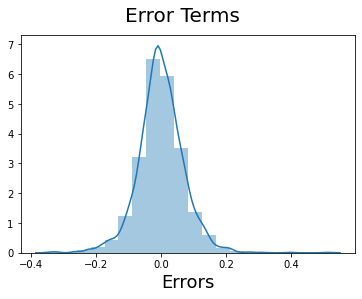

In [40]:
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train - y_train_rate), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)              
plt.xlabel('Errors', fontsize = 18)  

In [41]:
X_train_new = X_train_new.drop(['const'], axis=1)

In [42]:
num_vars = df.columns
df_test[num_vars] = scaler.transform(df_test[num_vars])

In [43]:
# Dividing into X_test and y_test
y_test = df_test.pop('TARGET_deathRate')
X_test = df_test

In [44]:
# Now let's use our model to make predictions.
# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[X_train_new.columns]
# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new)

In [45]:
# Making predictions
y_pred = lm.predict(X_test_new)

Text(0, 0.5, 'y_pred')

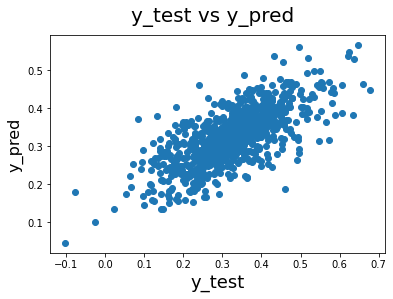

In [46]:
# Plotting y_test and y_pred to understand the spread
fig = plt.figure()
plt.scatter(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)             
plt.xlabel('y_test', fontsize=18)                          
plt.ylabel('y_pred', fontsize=16)